In [1]:
#!pip install packagename
# importing modules
import geopandas as gpd
import pandas as pd
import numpy as np
import plotly.express as px
import plotly.graph_objects as go
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import os
from os import chdir as cd
import time
import fiona
from datetime import date

C:\Users\uttar\AppData\Local\Temp\ipykernel_11076\2483259319.py:3: UserWarning: Shapely 2.0 is installed, but because PyGEOS is also installed, GeoPandas will still use PyGEOS by default for now. To force to use and test Shapely 2.0, you have to set the environment variable USE_PYGEOS=0. You can do this before starting the Python process, or in your code before importing geopandas:

import os
os.environ['USE_PYGEOS'] = '0'
import geopandas

In a future release, GeoPandas will switch to using Shapely by default. If you are using PyGEOS directly (calling PyGEOS functions on geometries from GeoPandas), this will then stop working and you are encouraged to migrate from PyGEOS to Shapely 2.0 (https://shapely.readthedocs.io/en/latest/migration_pygeos.html).
  import geopandas as gpd


In [2]:
df_main = pd.read_csv(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\df_attributes.csv', dtype = {'GEOID':str}, index_col = 0)
# df.columns

In [3]:
df_main['hh_income_by_taxRate'] = pd.cut(df_main['median_income'], 
                                    [0, 15700, 59850, 95350, 182000, 231250, 1000000],
                                    labels=["10%", "12%", "22%", "24%", "32%", "35%+"])
print(df_main['hh_income_by_taxRate'].isnull().sum())


3312


In [4]:
df_main.dtypes

STATEFP                                 int64
GEOID                                  object
NAMELSAD                               object
weighted_HU_density_sqmi              float64
P_20                                  float64
label                                  object
density_km2                           float64
Pop_estimate                           object
CensusPop_20                          float64
trend                                  object
future trend from SSP 1                object
future trend from SSP 2                object
future trend from SSP 3                object
future trend from SSP 4                object
future trend from SSP 5                object
REGION                                 object
DIVISION                              float64
tt_2_work_place                       float64
no_veh                                float64
veh_1                                 float64
veh_2_or+                             float64
GEOID_place                       

In [5]:
# Creating a Series
hh_income = pd.Series(df_main['hh_income_by_taxRate'],dtype='category')

# Display Series
# print("Created Series:\n",hh_income)

# Filling NaN values in this series
result = hh_income.cat.add_categories("no data").fillna("no data")
df_main['hhincome by taxRate'] = result

# hh vehicle ownership vs Population trend by REGION

In [6]:
df = df_main.copy()

for i in range(len(df)):
    # print(i)
    if df.loc[i,'REGION'] == 'Northeast':
        df.loc[i,'REGION'] = 1
    elif df.loc[i,'REGION'] == 'Midwest':
        df.loc[i,'REGION'] = 2 
    elif df.loc[i,'REGION'] == 'South':
        df.loc[i,'REGION'] = 3
    elif df.loc[i,'REGION'] == 'West':
        df.loc[i,'REGION'] = 4
    else:
        df.loc[i,'REGION'] = 5  
        
# for i in range(len(df)):
#     # print(i)
#     if df.loc[i,'city type'] == 'urban':
#         df.loc[i,'city type'] = 1
#     elif df.loc[i,'city type'] == 'suburban':
#         df.loc[i,'city type'] = 2
#     elif df.loc[i,'city type'] == 'periurban':
#         df.loc[i,'city type'] = 3
#     elif df.loc[i,'city type'] == 'rural':
#         df.loc[i,'city type'] = 4
#     else:
#         df.loc[i,'city type'] = 5  

# for i in range(len(df)):
#     # print(i)
#     if df.loc[i,'future trend from SSP 2'] == 'increasing':
#         df.loc[i,'future trend from SSP 2'] = 1
#     elif df.loc[i,'future trend from SSP 2'] == 'no trend':
#         df.loc[i,'future trend from SSP 2'] = 2
#     elif df.loc[i,'future trend from SSP 2'] == 'decreasing':
#         df.loc[i,'future trend from SSP 2'] = 3

In [7]:
df[df['REGION'] == 3]['STATEFP'].sort_values().unique() #.value_counts().sum()

array([ 1,  5, 10, 11, 12, 13, 21, 22, 24, 28, 37, 40, 45, 47, 48, 51, 54],
      dtype=int64)

In [36]:
print(df.shape)
df = df[df['future trend from SSP 2'].notnull()]
df = df[df['veh_<=_1'].notnull()]

print(df.shape)
df['veh 1 or less'] = pd.cut(df['veh_<=_1'], [-1, 10, 20, 30, 40, 50, 100],
                            labels=["0-10", "10-20", "20-30", "30-40", "40-50", "50+"])
df['veh 2 or more'] = pd.cut(df['veh_2_or+'], [-1, 10, 20, 30, 40, 50, 105],
                            labels=["0-10", "10-20", "20-30", "30-40", "40-50", "50+"])

df = df.sort_values(by = ['REGION', ])


(30785, 40)
(30785, 40)


In [9]:
# # Compute the correlation matrix
# d = df[['REGION','veh 1 or less', 'veh 2 or more','future trend from SSP 2', 'city type']].dropna()
# corr = d.corr()

# # Generate a mask for the upper triangle
# mask = np.triu(np.ones_like(corr, dtype=bool))

# # Set up the matplotlib figure
# f, ax = plt.subplots(figsize=(11, 9))

# # Generate a custom diverging colormap
# cmap = sns.diverging_palette(230, 20, as_cmap=True)

# # Draw the heatmap with the mask and correct aspect ratio
# sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
#             square=True, linewidths=.5, cbar_kws={"shrink": .5})

AttributeError: type object 'DOMWidget' has no attribute '_ipython_display_'

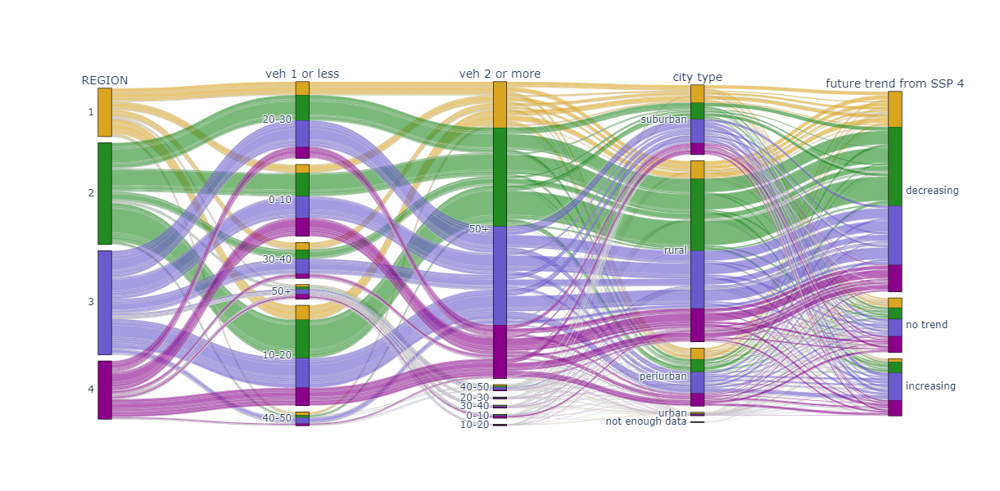

In [21]:
import plotly.graph_objects as go
from ipywidgets import widgets
import pandas as pd
import numpy as np

# cars_df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/imports-85.csv')

# Build parcats dimensions
categorical_dimensions = ['REGION', 'veh 1 or less', 'veh 2 or more','city type', 'future trend from SSP 4', ];#'hhincome by taxRate',

dimensions = [dict(values=df[label], label=label) for label in categorical_dimensions]

# Build colorscale
color = [x for x in df['REGION']]
colorscale = ['goldenrod','forestgreen','slateblue', 'darkmagenta']

# Build figure as FigureWidget
fig = go.FigureWidget(go.Parcats(
        # domain={'y': [0, 0.4]}, 
        dimensions=dimensions,
        line={'colorscale': colorscale,
              'color': color, 
              'shape': 'hspline'}))

fig.update_layout(
    height=600,
    # width=1600,
        # dragmode='lasso', hovermode='closest',
        font=dict(
        # family="Courier New, monospace",
        size=14,
        # color="RebeccaPurple"
    ))

fig
# fig.write_html(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\veh_income_populationTrend.html')
# fig.write_image(r'D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\vehicle_ownership.png')

In [113]:
df = df[df['future trend from SSP 2'].notnull()]
df = df[df['veh_<=_1'].notnull()]
# pd.crosstab(df.REGION, [df['future trend from SSP 1'], df['city type'], ], values=df['veh_<=_1'], aggfunc='count').round(0)

In [114]:
# pd.crosstab(df.REGION, [df['future trend from SSP 1'], df['city type'], ], values=df['veh_2_or+'], aggfunc='count').round(0)

In [115]:
# pd.crosstab(df.REGION, [df['future trend from SSP 2'], df['city type'], ], values=df['veh_<=_1'], aggfunc='mean').round(0)

In [116]:
# pd.crosstab(df.REGION, [df['future trend from SSP 2'], df['city type'], ], values=df['veh_2_or+'], aggfunc='mean').round(0)

In [117]:
# pd.crosstab(df.REGION, [df['future trend from SSP 4'], df['city type'],], values=df['veh_<=_1'], aggfunc=['mean',]).round(0)

In [118]:
# pd.crosstab(df.REGION, [df['future trend from SSP 4'], df['city type'],], values=df['veh_<=_1'], aggfunc=['median']).round(0)

In [119]:
# pd.crosstab(df.REGION, [df['future trend from SSP 4'], df['city type'], ], values=df['veh_2_or+'], aggfunc='count', normalize='index').round(3)

In [136]:
df.groupby(['future trend from SSP 2', 'city type', 'REGION'])[['veh_<=_1','veh_2_or+']].describe().round(2)

veh_<=_1                        \
                                                  count    mean    std    min   
future trend from SSP 2 city type       REGION                                  
decreasing              not enough data 2           1.0  100.00    NaN  100.0   
                                        4           5.0   67.06  46.80    0.0   
                        periurban       1         434.0   24.26  16.06    0.0   
                                        2         533.0   21.46  11.63    0.0   
                                        3         505.0   25.14  14.52    0.0   
                                        4         140.0   21.70  16.25    0.0   
                        rural           1        1446.0   21.49  15.15    0.0   
                                        2        5178.0   18.37  13.49    0.0   
                                        3        3645.0   22.87  18.50    0.0   
                                        4        1542.0   24.84  27.67    0.0   
                        suburban        1         691.0   24.75  12.27    0.0   
                                        2         618.0   23.55  10.10    0.0   
                                        3         428.0   27.03  13.14    0.0   
                                        4          99.0   22.99  11.92    0.0   
                        urban           1          26.0   44.47  13.00   23.3   
                                        2           5.0   42.04  15.91   17.2   
increasing              not enough data 4           2.0  100.00   0.00  100.0   
                        periurban       1         508.0   18.95  11.42    0.0   
                                        2         514.0   17.18   9.86    0.0   
                                        3        1434.0   19.25  12.28    0.0   
                                        4         987.0   15.21   9.89    0.0   
                        rural           1         219.0   17.94  16.81    0.0   
                                        2        1457.0   16.14  14.59    0.0   
                                        3        1543.0   19.32  17.72    0.0   
                                        4        1244.0   18.99  21.07    0.0   
                        suburban        1         813.0   23.68  12.66    0.0   
                                        2         764.0   22.28  10.47    0.0   
                                        3        1712.0   23.92  11.83    0.0   
                                        4         925.0   18.86   9.93    0.0   
                        urban           1         100.0   45.12  15.09   14.7   
                                        2          16.0   40.16   8.39   27.6   
                                        3          78.0   37.05  14.73    2.9   
                                        4          77.0   28.64  10.76   12.6   
no trend                not enough data 4           1.0   40.00    NaN   40.0   
                        periurban       1         154.0   22.28  13.73    0.0   
                                        2         216.0   17.67   9.28    0.0   
                                        3         165.0   22.07  14.73    0.0   
                                        4         122.0   16.16  11.49    0.0   
                        rural           1         107.0   19.31  14.47    0.0   
                                        2         486.0   17.93  15.06    0.0   
                                        3         522.0   21.31  17.83    0.0   
                                        4         497.0   26.48  30.26    0.0   
                        suburban        1         253.0   24.05  12.03    0.0   
                                        2         246.0   22.53  10.88    0.0   
                                        3         228.0   25.24  10.38    0.0   
                                        4          89.0   19.84  11.12    1.7   
                        urban           1           7.0   44.17   6.14   37.0 

In [138]:
df.groupby(['future trend from SSP 2', 'city type', 'REGION'])[['median_income']].describe().round(0)

median_income            \
                                                       count      mean   
future trend from SSP 2 city type       REGION                           
decreasing              not enough data 2                0.0       NaN   
                                        4                0.0       NaN   
                        periurban       1              404.0   70631.0   
                                        2              524.0   60692.0   
                                        3              482.0   45910.0   
                                        4              133.0   57489.0   
                        rural           1             1333.0   59345.0   
                                        2             4801.0   51470.0   
                                        3             3114.0   43397.0   
                                        4             1193.0   50681.0   
                        suburban        1              680.0   68224.0   
                                        2              614.0   58497.0   
                                        3              422.0   43437.0   
                                        4               97.0   48819.0   
                        urban           1               25.0   51901.0   
                                        2                5.0   40992.0   
increasing              not enough data 4                1.0    2499.0   
                        periurban       1              493.0  110390.0   
                                        2              507.0   79677.0   
                                        3             1378.0   74452.0   
                                        4              965.0   84420.0   
                        rural           1              194.0   91935.0   
                                        2             1301.0   60003.0   
                                        3             1324.0   58218.0   
                                        4             1006.0   66100.0   
                        suburban        1              802.0   88016.0   
                                        2              764.0   73459.0   
                                        3             1698.0   71451.0   
                                        4              917.0   82043.0   
                        urban           1              100.0   72914.0   
                                        2               16.0   61563.0   
                                        3               78.0   75227.0   
                                        4               77.0   84902.0   
no trend                not enough data 4                1.0   43750.0   
                        periurban       1              148.0   79565.0   
                                        2              211.0   69370.0   
                                        3              157.0   55147.0   
                                        4              119.0   66942.0   
                        rural           1              102.0   69497.0   
                                        2              430.0   55982.0   
                                        3              439.0   49561.0   
                                        4              407.0   58336.0   
                        suburban        1              247.0   73390.0   
                                        2              245.0   62880.0   
                                        3              222.0   48868.0   
                                        4               88.0   61303.0   
                        urban           1                7.0   46765.0   
                                        2                2.0   35946.0   
                                        4                1.0  120437.0   

                                                                             \
                                                    std       min       25%   
future trend from SSP 2 city type       

In [11]:

# colorscale = ['brown', 'gold','yellowgreen','darkgreen','grey']
# fig = px.parallel_categories(df[['REGION','veh 1 or less', 'veh 2 or more','future trend from SSP 2', 'city type',]],
#                              color = 'city type',
#                              labels={"city type": "city class",
#                                      'veh 1 or less': '% people with 1 or less vehicle',
#                                      'veh 2 or more': '% people with 2 or more vehicle',
#                                     },
#                              color_continuous_scale=colorscale, #px.colors.sequential.Viridis,
#                              color_continuous_midpoint=3)

# # Hide the color scale that is useless in this case
# fig.update_layout(coloraxis_showscale=True)

# fig.update_layout(
#         height=600)


# # Hide the color scale that is useless in this case
# fig.update_layout(coloraxis_showscale=True)

# # Show the plot
# fig.show()

In [12]:
df.columns

Index(['STATEFP', 'GEOID', 'NAMELSAD', 'weighted_HU_density_sqmi', 'P_20',
       'label', 'density_km2', 'Pop_estimate', 'CensusPop_20', 'trend',
       'future trend from SSP 1', 'future trend from SSP 2',
       'future trend from SSP 3', 'future trend from SSP 4',
       'future trend from SSP 5', 'REGION', 'DIVISION', 'tt_2_work_place',
       'no_veh', 'veh_1', 'veh_2_or+', 'GEOID_place', 'GEOID_cbsa',
       'cbsa20-to-place allocation factor', 'tt_2_work', 'GEOID_',
       'Urban area (2022)_count', 'population_place_sum',
       'ua-to-place allocation factor_min',
       'ua-to-place allocation factor_max', 'population_ua_min',
       'population_ua_max', 'city type', 'median_income', 'veh 1+', 'veh_<=_1',
       'hh_income_by_taxRate', 'hhincome by taxRate', 'veh 1 or less',
       'veh 2 or more'],
      dtype='object')

In [13]:
df[df['median_income'].isnull()][['STATEFP', 'NAMELSAD', 'city type', 'median_income','Pop_estimate','no_veh', 'veh_1',
       'hh_income_by_taxRate', 'veh 1 or less', 'veh 2 or more']]['city type']

16727    periurban
16804        rural
16739        rural
16738        rural
16800        rural
           ...    
3251         rural
3248         rural
3239         rural
3244         rural
3249         rural
Name: city type, Length: 2511, dtype: object

# Income vs Population trend by REGION

AttributeError: type object 'DOMWidget' has no attribute '_ipython_display_'

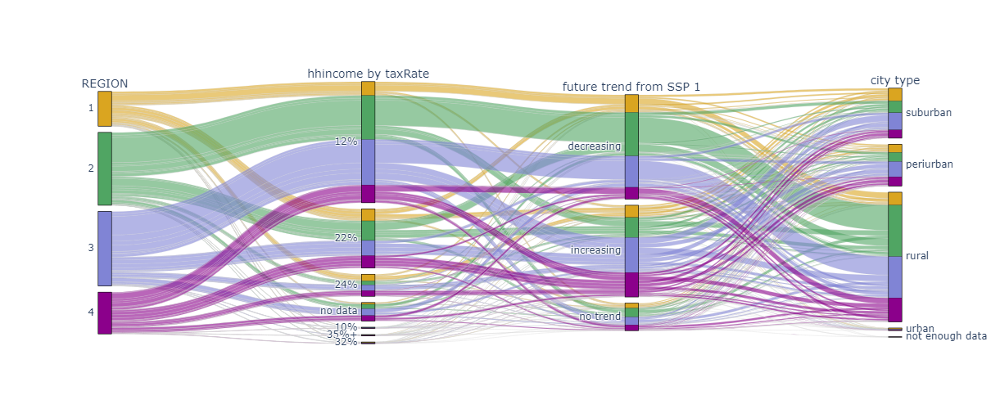

In [60]:
import plotly.graph_objects as go
from ipywidgets import widgets
import pandas as pd
import numpy as np

# cars_df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/imports-85.csv')

# Build parcats dimensions
categorical_dimensions = ['REGION','hhincome by taxRate', 'future trend from SSP 1', 'city type',];

dimensions = [dict(values=df[label], label=label) for label in categorical_dimensions]

# Build colorscale
color = [x for x in df['REGION']]
colorscale = ['goldenrod','forestgreen','lightblue', 'slateblue', 'darkmagenta']

# Build figure as FigureWidget
fig = go.FigureWidget(go.Parcats(
        # domain={'y': [0, 0.4]}, 
        dimensions=dimensions,
        line={'colorscale': colorscale,
              'color': color, 
              'shape': 'hspline'}))

fig.update_layout(
    height=500,
    width=1000,
        # dragmode='lasso', hovermode='closest',
        font=dict(
        # family="Courier New, monospace",
        size=14,
        # color="RebeccaPurple"
    ))

fig

AttributeError: type object 'DOMWidget' has no attribute '_ipython_display_'

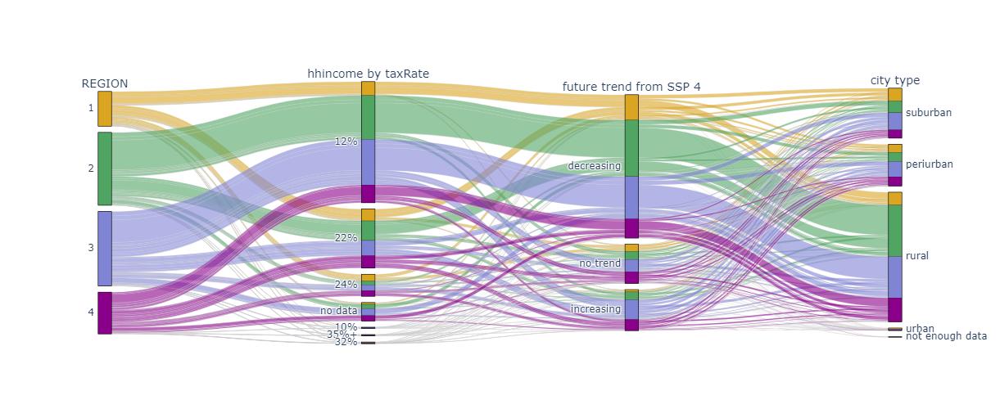

In [61]:
import plotly.graph_objects as go
from ipywidgets import widgets
import pandas as pd
import numpy as np

# cars_df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/imports-85.csv')

# Build parcats dimensions
categorical_dimensions = ['REGION','hhincome by taxRate', 'future trend from SSP 4', 'city type',];

dimensions = [dict(values=df[label], label=label) for label in categorical_dimensions]

# Build colorscale
color = [x for x in df['REGION']]
colorscale = ['goldenrod','forestgreen','lightblue', 'slateblue', 'darkmagenta']

# Build figure as FigureWidget
fig = go.FigureWidget(go.Parcats(
        # domain={'y': [0, 0.4]}, 
        dimensions=dimensions,
        line={'colorscale': colorscale,
              'color': color, 
              'shape': 'hspline'}))

fig.update_layout(
    height=500,
    width=1000,
        # dragmode='lasso', hovermode='closest',
        font=dict(
        # family="Courier New, monospace",
        size=14,
        # color="RebeccaPurple"
    ))

fig

In [56]:
# # Group the data by the three categorical variables and sum the values
# trend_column = 'future trend from SSP 2'
# sum_column = 'hhincome by taxRate'

# grouped_data1 = df[(df['city type'] != 'not enough data') & (df['REGION'] == 1)].groupby(['city type',
#                                                                                                    trend_column, sum_column])[['GEOID']].count()
# # Convert the grouped data into a hierarchical structure
# hierarchical_data1 = grouped_data1.pivot_table(values='GEOID', index=['city type', ], columns=trend_column ,)
# # Normalize the data
# normalized_data1 = hierarchical_data1.apply(lambda x: x/x.sum(), axis=1)

# grouped_data2 = df[(df['city type'] != 'not enough data') & (df['REGION'] == 2)].groupby(['city type',
#                                                                                                    trend_column, sum_column ])[['GEOID']].count()
# # Convert the grouped data into a hierarchical structure
# hierarchical_data2 = grouped_data2.pivot_table(values='GEOID', index=['city type', ], columns=trend_column ,)
# # Normalize the data
# normalized_data2 = hierarchical_data2.apply(lambda x: x/x.sum(), axis=1)

# grouped_data3 = df[(df['city type'] != 'not enough data') & (df['REGION'] == 3)].groupby(['city type',
#                                                                                                    trend_column, sum_column])[['GEOID']].count()
# # Convert the grouped data into a hierarchical structure
# hierarchical_data3 = grouped_data3.pivot_table(values='GEOID', index=['city type', ], columns=trend_column ,)
# # Normalize the data
# normalized_data3 = hierarchical_data3.apply(lambda x: x/x.sum(), axis=1)

# grouped_data4 = df[(df['city type'] != 'not enough data') & (df['REGION'] == 4)].groupby(['city type',
#                                                                                                    trend_column, sum_column])[['GEOID']].count()
# # Convert the grouped data into a hierarchical structure
# hierarchical_data4 = grouped_data4.pivot_table(values='GEOID', index=['city type', ], columns=trend_column ,)
# # Normalize the data
# normalized_data4 = hierarchical_data4.apply(lambda x: x/x.sum(), axis=1)


# fig, axes = plt.subplots(2, 2, figsize=(15, 12), sharey=True)
# # fig.suptitle('Percent cities for different community type and Regions with their expected trend from SSP 2',)
# sns.set(font_scale = 1.2)
# # Bulbasaur
# sns.heatmap(normalized_data1, annot=True, fmt='.2%', cmap='YlGnBu', ax= axes[0][0] , cbar_ax=None)
# axes[0][0].set_title('Northeast')
# axes[0][0].set_xlabel('')
# axes[0][0].set_ylabel('')


# sns.heatmap(normalized_data2, annot=True, fmt='.2%', cmap='YlGnBu', ax= axes[0][1] ,)
# axes[0][1].set_title('Midwest')
# axes[0][1].set_ylabel('')
# axes[0][1].set_xlabel('')


# sns.heatmap(normalized_data3, annot=True, fmt='.2%', cmap='YlGnBu', ax= axes[1][0] , )
# axes[1][0].set_title('South')
# axes[1][0].set_ylabel('')

# sns.heatmap(normalized_data4, annot=True, fmt='.2%', cmap='YlGnBu', ax= axes[1][1] , )
# axes[1][1].set_title('West')
# axes[1][1].set_ylabel('')

# fig.savefig('D:\Work\Box Sync\Depop Paper NC\Paper Draft NC\Figures\Trend with DoU_' + str(trend_column) + '.png', 
#             dpi = 300, bbox_inches='tight')

In [92]:
df = df_main.copy()

for i in range(len(df)):
    # print(i)
    if df.loc[i,'future trend from SSP 2'] == 'increasing':
        df.loc[i,'future trend from SSP 2'] = 1
    elif df.loc[i,'future trend from SSP 2'] == 'no trend':
        df.loc[i,'future trend from SSP 2'] = 2
    elif df.loc[i,'future trend from SSP 2'] == 'decreasing':
        df.loc[i,'future trend from SSP 2'] = 3

In [94]:
df_south = df[df['REGION'] == 'South'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()
df_west = df[df['REGION'] == 'West'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()
df_midwest = df[df['REGION'] == 'Midwest'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()
df_northeast = df[df['REGION'] == 'Northeast'].reset_index(drop = True)[['future trend from SSP 2', 'median_income', 'hh_income_by_taxRate']].dropna()


In [102]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_south['future trend from SSP 2'],columns=df_south['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_south.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_south.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)

hh_income_by_taxRate     10%   12%   22%  24%  32%  35%+
future trend from SSP 2                                 
1                         11  2279  1447  659   53    31
2                          7   608   172   32    1     0
3                         39  3406   477  101    1     1
The P-Value of the ChiSq Test is: 3.0409471316678297e-263


----Statistics from one way ANOVA----
F-Statistic: 818.4671241829361
P-value: 0.0


----Statistics from Kruskal-Wallis----
H-Statistic: 1808.874071342676
P-value: 0.0


In [103]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_west['future trend from SSP 2'],columns=df_west['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_west.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_west.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)


hh_income_by_taxRate     10%   12%   22%  24%  32%  35%+
future trend from SSP 2                                 
1                         11  1049  1186  648   42    32
2                          1   365   184   64    1     1
3                         16  1038   326   56    2     0
The P-Value of the ChiSq Test is: 1.9543788075541208e-131


----Statistics from one way ANOVA----
F-Statistic: 329.6074734433045
P-value: 3.1935135789049384e-135


----Statistics from Kruskal-Wallis----
H-Statistic: 757.8376529163778
P-value: 2.739331426855337e-165


In [104]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_northeast['future trend from SSP 2'],columns=df_northeast['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_northeast.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_northeast.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)

hh_income_by_taxRate     10%   12%  22%  24%  32%  35%+
future trend from SSP 2                                
1                          0   325  644  542   47    31
2                          1   189  211   97    6     0
3                          4  1384  771  267   10     8
The P-Value of the ChiSq Test is: 4.116473674286151e-138


----Statistics from one way ANOVA----
F-Statistic: 368.04642682253734
P-value: 7.613507348138938e-149


----Statistics from Kruskal-Wallis----
H-Statistic: 706.4916301062717
P-value: 3.866266326937705e-154


In [105]:
# Cross tabulation 
CrosstabResult=pd.crosstab(index=df_midwest['future trend from SSP 2'],columns=df_midwest['hh_income_by_taxRate'])
print(CrosstabResult)
# importing the required function
from scipy.stats import chi2_contingency
# Performing Chi-sq test
ChiSqResult = chi2_contingency(CrosstabResult)
# P-Value is the Probability of H0 being True
# If P-Value&gt;0.05 then only we Accept the assumption(H0)
print('The P-Value of the ChiSq Test is:', ChiSqResult[1])
print('\n')
from scipy.stats import f_oneway
# Perform one-way ANOVA
f_statistic, p_value = f_oneway(*[group['median_income'].values for name, group in df_midwest.groupby("future trend from SSP 2")])
# Print results
print('----Statistics from one way ANOVA----')
print("F-Statistic:", f_statistic)
print("P-value:", p_value)
print('\n')
# Kuruskul Wallis Test
from scipy.stats import kruskal
#perform Kruskal-Wallis Test 
H_statistic, p_value = kruskal(*[group["median_income"].values for name, group in df_midwest.groupby("future trend from SSP 2")])
print('----Statistics from Kruskal-Wallis----')
print("H-Statistic:", H_statistic)
print("P-value:", p_value)

hh_income_by_taxRate     10%   12%   22%  24%  32%  35%+
future trend from SSP 2                                 
1                          7  1216  1036  301   16    14
2                          4   517   292   73    1     1
3                         20  4363  1384  167   11     3
The P-Value of the ChiSq Test is: 3.821526111351939e-138


----Statistics from one way ANOVA----
F-Statistic: 370.59450856395364
P-value: 1.1727179146697056e-155


----Statistics from Kruskal-Wallis----
H-Statistic: 715.7157547722887
P-value: 3.839711067486734e-156
